# BigQuery AI for Construction: Automating Inspection and Reporting

| Author |
| --- |
| [Olek Arsentiev](https://github.com/arsentievalex) |

## Introduction

The potential of modern AI solutions has not yet been fully embedded in physical, real-world industries such as construction. One particularly promising area is construction field reporting, a growing market segment driven by the need for safety assessments, progress tracking, and regulatory compliance on construction sites.

The construction inspection and field reporting market is substantial and experiencing steady growth. The Building Inspection Services Market was valued at **12.5b USD in 2024** and is projected to reach **22.6b USD by 2034**, with a compound annual growth rate (CAGR) of **6.1%** ([*source*](https://www.news.market.us/building-inspection-services-market-news/)) Construction companies face significant expenses in conducting field inspections and preparing reports. Professionals spend around **35% of their work hours** on administrative tasks such as reporting and documentation. For example, a safety officer on a large site may spend **8–10 hours per week** on manual documentation. Across 10 active sites, this equates to more than **1,000 hours annually**, representing **30,000–40,000 USD in hidden salary costs** devoted solely to paperwork ([*source*](https://www.boxcore.com/construction-safety-management-software-3/))

This notebook focuses on inspection field reporting—assessing site conditions, construction progress, and safety compliance. Field reports are essential for construction management: they provide evidence of completed work, serve as a communication tool among stakeholders, and help mitigate risks.

To create a report that meets industry standards, inspectors typically visit the site, take photos, and record notes. Increasingly, they capture observations as voice recordings rather than structured forms, as time and site conditions often make detailed data entry impractical. Once collected, photos and recordings must be reviewed manually, with specific details extracted for inclusion in the final report. This process is slow, labor-intensive, and costly.

## Objective

In this notebook, we will use **BigQuery’s native AI capabilities** to automate the manual and costly process of creating field reports. Specifically, we will analyze a sample dataset containing both structured and unstructured data from renovation, safety inspection, and construction projects.

High-level architecture diagram:
![BigQuery AI Diagram](https://i.postimg.cc/65hmcWrj/bq-diagram.png)

The structured dataset includes fields such as:  
- `project_id`  
- `project_type` (renovation, safety inspection, construction)  
- `city`  
- `customer_id`  

The unstructured dataset contains photos of projects and audio recordings of inspectors describing their on-site observations. For each project, we will aim to extract the following details:

**Renovation Projects**  
- Inspector’s name  
- Inspection date  
- Inspection address  
- Object of renovation  
- Observed conditions  
- Risks  
- Assigned crew  
- Recommended action  
- Urgency score (1–10)  

**Safety Inspections**  
- Inspector’s name  
- Inspection date  
- Inspection address  
- Weather conditions  
- Risk type  
- Object at risk  
- Recommended action  
- Responsible party  
- Urgency score (1–10)  

**Construction Projects**  
- Inspector’s name  
- Inspection date  
- Inspection address  
- Object of construction  
- Weather conditions  
- Progress score (1–10)  
- Risks  
- Recommended action  

The extracted data will help prioritize projects with the highest safety concerns, assign tasks to the appropriate crews or responsible parties, and generate standardized inspection reports using templates. This will significantly reduce the time spent on manual analysis.  

Additionally, we will perform aggregate analysis on unstructured data to identify common safety issues across cities and recurring risks in renovation projects.


Below is a visual representation of our output table:
![BigQuery Output](https://i.postimg.cc/9fGvTdQS/bq-table.png)


## Getting Started

The code cells below are used to import the necessary libraries, initialize variables, and define helper functions.

In [4]:
# Import necessary libraries
from google.colab import auth
from google.cloud import bigquery
from google.cloud import storage
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import io
import math
import time

# Show all content in each cell, no truncation
pd.set_option("display.max_colwidth", None)

In [5]:
# Authenicate with your Google account
auth.authenticate_user()

In [6]:
# Replace 'your-project-id' with your actual Google Cloud Project ID
PROJECT_ID = 'gen-lang-client-0812538624'

# Create a BigQuery client
client = bigquery.Client(project=PROJECT_ID)

In [ ]:
# Make a copy of the bucket with unstructured data into your project.

# # Define the source and destination bucket names
# SOURCE_BUCKET_NAME = 'bq-hackathon-bucket'
# DESTINATION_BUCKET_NAME = f'gs://{PROJECT_ID}-{SOURCE_BUCKET_NAME}'

# # 1. Create the new bucket in the destination project
# # The 'mb' command stands for 'make bucket'
# print(f"Creating destination bucket: {DESTINATION_BUCKET_NAME}")
# !gsutil mb $DESTINATION_BUCKET_NAME

# # 2. Copy all content from the source to the new bucket
# print(f"Copying contents from gs://{SOURCE_BUCKET_NAME} to {DESTINATION_BUCKET_NAME}")
# !gsutil -m cp -r gs://{SOURCE_BUCKET_NAME}/* $DESTINATION_BUCKET_NAME/

In [ ]:
# Create Cloud Storage client (when the bucket already exists in your project)
bucket = 'bq-hackathon-bucket'
storage_client = storage.Client(project=PROJECT_ID)
bucket = storage_client.bucket(bucket)

In [55]:
# Create a dataset in your BigQuery instance
q = """
CREATE SCHEMA IF NOT EXISTS `bq_hackathon_ds` OPTIONS (location = 'US');
"""

client.query(q)

QueryJob<project=gen-lang-client-0812538624, location=US, id=5b3055eb-2613-4ec0-85ed-1616a85b90ef>

In [73]:
# Follow the steps below to create an external connection in BigQuery if it doesn't exist.
# Source: https://colab.research.google.com/github/GoogleCloudPlatform/generative-ai/blob/main/gemini/use-cases/applying-llms-to-data/multimodal-analysis-bigquery/analyze_multimodal_data_bigquery.ipynb

# !bq mk --connection --location=us \
#     --connection_type=CLOUD_RESOURCE bq-kaggle-conn

# SERVICE_ACCT = !bq show --format=prettyjson --connection us.bq-kaggle-conn | grep "serviceAccountId" | cut -d '"' -f 4
# SERVICE_ACCT_EMAIL = SERVICE_ACCT[-1]
# print(SERVICE_ACCT_EMAIL)

# !gcloud projects add-iam-policy-binding --format=none $PROJECT_ID --member=serviceAccount:$SERVICE_ACCT_EMAIL --role='roles/storage.objectViewer'
# !gcloud projects add-iam-policy-binding --format=none $PROJECT_ID --member=serviceAccount:$SERVICE_ACCT_EMAIL --role='roles/aiplatform.user'

# Wait ~60 seconds, to give IAM updates time to propagate. Otherwise, subsequent cells may fail.
# time.sleep(60)

In [59]:
# Imports for GCS, plotting, and image handling
# Source: https://github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/use-cases/applying-llms-to-data/bigquery_embeddings_vector_search.ipynb

def display_product_images(df):
    """
    Displays product images from a DataFrame in a 3-column grid.
    Simplified for clarity in a tutorial context.
    """

    # Calculate grid size
    num_images = len(df)
    cols = 3
    rows = math.ceil(num_images / cols)

    fig, axs = plt.subplots(rows, cols, figsize=(10, rows * 3.5))

    # Flatten the axes array for easy iteration, regardless of shape
    axs = axs.flatten()

    for i, row in df.iterrows():
        # Extract the image path from the full GCS URI
        image_path = row['uri'].split('/', 3)[-1]

        # Get the image from GCS
        blob = bucket.blob(image_path)
        image = Image.open(io.BytesIO(blob.download_as_bytes()))

        # Plot the image
        axs[i].imshow(image)
        axs[i].set_title(image_path.split('/')[-1], fontsize=10)
        axs[i].axis('off')

    # Hide any unused subplots
    for j in range(num_images, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

## Data Prep

### Create a structured table

First, we will create a sample table containing structured data with basic fields. The table includes a `project_id` column, which serves as a unique identifier for each project.


In [8]:
# Load sample structured data

q = """
CREATE OR REPLACE TABLE `bq_hackathon_ds.projects` (
  project_id INT64,
  project_type STRING,
  customer_id INT64,
  city STRING
);


INSERT INTO `bq_hackathon_ds.projects` (project_id, project_type, customer_id, city)
VALUES
  (12556, 'renovation', 11, 'Dallas'),
  (12557, 'renovation', 12, 'Dallas'),
  (12558, 'renovation', 13, 'Austin'),
  (12559, 'safety inspection', 14, 'Denver'),
  (12560, 'safety inspection', 15, 'Denver'),
  (12561, 'renovation', 16, 'Austin'),
  (12562, 'construction', 17, 'Houston'),
  (12563, 'construction', 18, 'Houston');

  """

client.query(q)

QueryJob<project=gen-lang-client-0812538624, location=US, id=c149a778-598e-4f0c-92ea-46a1022ed38f>

Let's have a look at this table.

In [9]:
q = """
SELECT *
FROM bq_hackathon_ds.projects
LIMIT 5
"""

df = client.query(q).to_dataframe()
df

,project_id,project_type,customer_id,city
0,12561,renovation,16,Austin
1,12558,renovation,13,Austin
2,12556,renovation,11,Dallas
3,12557,renovation,12,Dallas
4,12560,safety inspection,15,Denver


### Create an image object table

We have photos stored in Google Cloud Storage corresponding to the projects.  
The following code creates an object table over a bucket containing these inspection photos.

In [10]:
q = """
CREATE OR REPLACE EXTERNAL TABLE `bq_hackathon_ds.img_obj_table`
WITH CONNECTION `us.bq-kaggle-conn`
OPTIONS (
  object_metadata = 'SIMPLE',
  uris = ['gs://bq-hackathon-bucket/photos/*.png']
);
"""

client.query(q)

QueryJob<project=gen-lang-client-0812538624, location=US, id=f5793a10-9298-407e-9bfc-7a1d15f7f73f>

Let's check the table contents. Notice the ref column, which is an `ObjectRef` that we can use for model inference.

In [11]:
q = """
SELECT *
FROM bq_hackathon_ds.img_obj_table
LIMIT 6
"""

df = client.query(q).to_dataframe()
df

,uri,generation,content_type,size,md5_hash,updated,metadata,ref
0,gs://bq-hackathon-bucket/photos/12556.png,1758384674518566,image/png,1249058,20fb04b260b3ee0464a59bf91054b5ad,2025-09-20 16:11:14.551000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/photos/12556.png', 'version': '1758384674518566', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""20fb04b260b3ee0464a59bf91054b5ad"",""size"":1249058,""updated"":1758384674551000}}'}"
1,gs://bq-hackathon-bucket/photos/12557.png,1758384671321846,image/png,1523344,416e2e5bf9362449bbb734fc0d21759f,2025-09-20 16:11:11.361000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/photos/12557.png', 'version': '1758384671321846', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""416e2e5bf9362449bbb734fc0d21759f"",""size"":1523344,""updated"":1758384671361000}}'}"
2,gs://bq-hackathon-bucket/photos/12558.png,1758384671312161,image/png,286594,cb536a82ae430ef456f7b4d60a03bf23,2025-09-20 16:11:11.346000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/photos/12558.png', 'version': '1758384671312161', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""cb536a82ae430ef456f7b4d60a03bf23"",""size"":286594,""updated"":1758384671346000}}'}"
3,gs://bq-hackathon-bucket/photos/12559.png,1758384671219909,image/png,737719,accc13fb73174783311c332e3b7e33d4,2025-09-20 16:11:11.253000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/photos/12559.png', 'version': '1758384671219909', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""accc13fb73174783311c332e3b7e33d4"",""size"":737719,""updated"":1758384671253000}}'}"
4,gs://bq-hackathon-bucket/photos/12560.png,1758384672914806,image/png,1213819,3969ffc5769756b902077d7536befee6,2025-09-20 16:11:12.950000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/photos/12560.png', 'version': '1758384672914806', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""3969ffc5769756b902077d7536befee6"",""size"":1213819,""updated"":1758384672950000}}'}"
5,gs://bq-hackathon-bucket/photos/12561.png,1758384672793345,image/png,311115,6e09fb37ceaf70c1e81e48e3258e0029,2025-09-20 16:11:12.827000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/photos/12561.png', 'version': '1758384672793345', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""6e09fb37ceaf70c1e81e48e3258e0029"",""size"":311115,""updated"":1758384672827000}}'}"


Below is a sample of the inspection photos that we will be using.

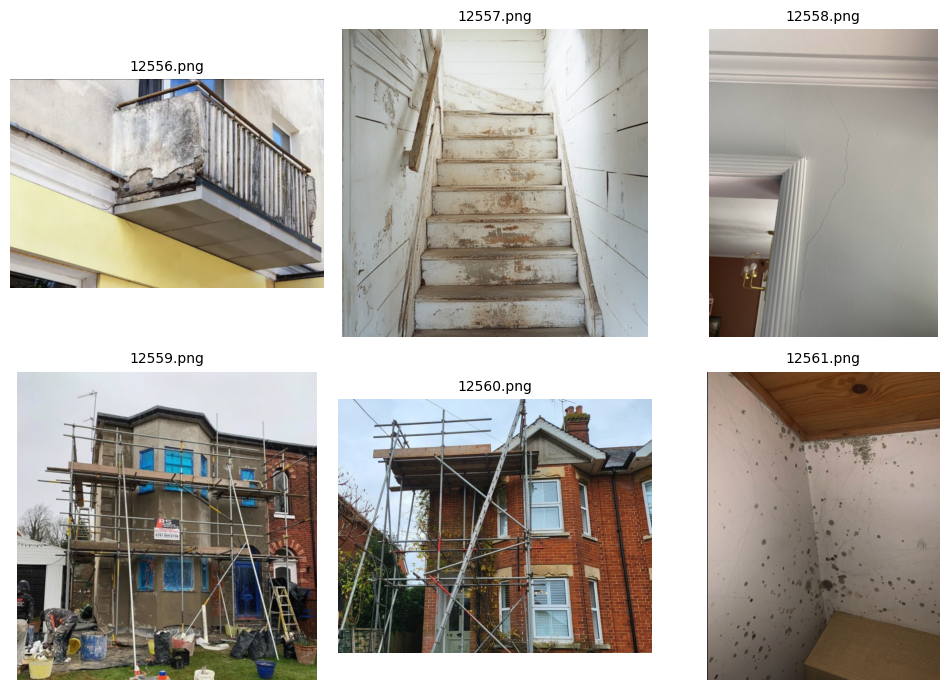

In [12]:
display_product_images(df)

### Create an audio object table

We also have voice recordings stored in Google Cloud Storage corresponding to the projects.
The following creates an object table over a bucket containing voice recordings of on-site inspections.

In [13]:
q = """
CREATE OR REPLACE EXTERNAL TABLE `bq_hackathon_ds.audio_obj_table`
WITH CONNECTION `us.bq-kaggle-conn`
OPTIONS (
  object_metadata = 'SIMPLE',
  uris = ['gs://bq-hackathon-bucket/recordings/*.mp3']
);
"""

client.query(q)

QueryJob<project=gen-lang-client-0812538624, location=US, id=ee02c743-bda6-4fe7-b707-9d8f7831a991>

The audio object table below has the same format as an image object table.

In [14]:
q = """
SELECT *
FROM bq_hackathon_ds.audio_obj_table
LIMIT 3
"""

df = client.query(q).to_dataframe()
df

,uri,generation,content_type,size,md5_hash,updated,metadata,ref
0,gs://bq-hackathon-bucket/recordings/12556.mp3,1758384693222870,audio/mpeg,1928827,2f917b199872690271bdc9fdbb1aedd1,2025-09-20 16:11:33.258000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/recordings/12556.mp3', 'version': '1758384693222870', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""audio/mpeg"",""md5_hash"":""2f917b199872690271bdc9fdbb1aedd1"",""size"":1928827,""updated"":1758384693258000}}'}"
1,gs://bq-hackathon-bucket/recordings/12557.mp3,1758401393420015,audio/mpeg,1336984,7edbdd10ba258baad14c74dbb3ee72be,2025-09-20 20:49:53.454000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/recordings/12557.mp3', 'version': '1758401393420015', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""audio/mpeg"",""md5_hash"":""7edbdd10ba258baad14c74dbb3ee72be"",""size"":1336984,""updated"":1758401393454000}}'}"
2,gs://bq-hackathon-bucket/recordings/12558.mp3,1758401644967071,audio/mpeg,767306,d417cf2513d40cb28a5868f412df28bf,2025-09-20 20:54:05.003000+00:00,[],"{'uri': 'gs://bq-hackathon-bucket/recordings/12558.mp3', 'version': '1758401644967071', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""audio/mpeg"",""md5_hash"":""d417cf2513d40cb28a5868f412df28bf"",""size"":767306,""updated"":1758401645003000}}'}"


We will download a few voice recordings locally to embed in the notebook for demonstration and sanity checks.

In [15]:
# download sample audio recording
!gsutil cp gs://bq-hackathon-bucket/recordings/12556.mp3 ./audio_12556.mp3
!gsutil cp gs://bq-hackathon-bucket/recordings/12559.mp3 ./audio_12559.mp3
!gsutil cp gs://bq-hackathon-bucket/recordings/12562.mp3 ./audio_12562.mp3

Copying gs://bq-hackathon-bucket/recordings/12556.mp3...
/ [1 files][  1.8 MiB/  1.8 MiB]                                                
Operation completed over 1 objects/1.8 MiB.                                      
Copying gs://bq-hackathon-bucket/recordings/12559.mp3...
/ [1 files][  1.7 MiB/  1.7 MiB]                                                
Operation completed over 1 objects/1.7 MiB.                                      
Copying gs://bq-hackathon-bucket/recordings/12562.mp3...
/ [1 files][  2.9 MiB/  2.9 MiB]                                                
Operation completed over 1 objects/2.9 MiB.                                      


A sample of the voice recording. The audio was generated using ElevenLabs, with added background construction noise to simulate real inspection conditions.

In [16]:
from IPython.display import Audio

Audio('audio_12559.mp3')

### Create a multimodal table

We're going to join the projects table that contains structured attributes to the img_obj_table and audio_obj_table tables, which contain the `ObjectRef` column, ref. The joining key is a project ID which contains in image and audio file names.

In [17]:
# create a multimodal table
q = r"""
CREATE OR REPLACE TABLE `bq_hackathon_ds.projects_multimodal` AS
SELECT
  p.*,
  img.ref AS img_ref,
  a.ref AS audio_ref
FROM
  `bq_hackathon_ds.projects` AS p
LEFT JOIN
  `bq_hackathon_ds.img_obj_table` AS img
ON
  p.project_id = CAST(REGEXP_EXTRACT(img.uri, r'photos/(\d+).png') AS INT64)
LEFT JOIN
  `bq_hackathon_ds.audio_obj_table` AS a
ON
  p.project_id = CAST(REGEXP_EXTRACT(a.uri, r'recordings/(\d+).mp3') AS INT64)
"""

job = client.query(q)  # Start the query job
job.result()  # Wait for the job to complete
print("Table created successfully.")

Table created successfully.


Let's have a look at our multimodal table.

In [18]:
q = """
SELECT *
FROM bq_hackathon_ds.projects_multimodal
ORDER BY project_id
LIMIT 3
"""

df = client.query(q).to_dataframe()
df

,project_id,project_type,customer_id,city,img_ref,audio_ref
0,12556,renovation,11,Dallas,"{'uri': 'gs://bq-hackathon-bucket/photos/12556.png', 'version': '1758384674518566', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""20fb04b260b3ee0464a59bf91054b5ad"",""size"":1249058,""updated"":1758384674551000}}'}","{'uri': 'gs://bq-hackathon-bucket/recordings/12556.mp3', 'version': '1758384693222870', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""audio/mpeg"",""md5_hash"":""2f917b199872690271bdc9fdbb1aedd1"",""size"":1928827,""updated"":1758384693258000}}'}"
1,12557,renovation,12,Dallas,"{'uri': 'gs://bq-hackathon-bucket/photos/12557.png', 'version': '1758384671321846', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""416e2e5bf9362449bbb734fc0d21759f"",""size"":1523344,""updated"":1758384671361000}}'}","{'uri': 'gs://bq-hackathon-bucket/recordings/12557.mp3', 'version': '1758401393420015', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""audio/mpeg"",""md5_hash"":""7edbdd10ba258baad14c74dbb3ee72be"",""size"":1336984,""updated"":1758401393454000}}'}"
2,12558,renovation,13,Austin,"{'uri': 'gs://bq-hackathon-bucket/photos/12558.png', 'version': '1758384671312161', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""image/png"",""md5_hash"":""cb536a82ae430ef456f7b4d60a03bf23"",""size"":286594,""updated"":1758384671346000}}'}","{'uri': 'gs://bq-hackathon-bucket/recordings/12558.mp3', 'version': '1758401644967071', 'authorizer': 'gen-lang-client-0812538624.us.bq-kaggle-conn', 'details': '{""gcs_metadata"":{""content_type"":""audio/mpeg"",""md5_hash"":""d417cf2513d40cb28a5868f412df28bf"",""size"":767306,""updated"":1758401645003000}}'}"


## BigQuery AI
### Create a model

For BigQuery's `AI.GENERATE_TABLE` to call Gemini to parse unstructured data, we first need to create a [Remote Model](https://cloud.google.com/bigquery/docs/reference/standard-sql/bigqueryml-syntax-create-remote-model). We'll create that and move to our multimodal query.

In [19]:
q = """
CREATE OR REPLACE MODEL `bq_hackathon_ds.gemini`
REMOTE WITH CONNECTION `us.bq-kaggle-conn`
  OPTIONS(ENDPOINT = 'gemini-2.5-flash');
"""

client.query(q)

QueryJob<project=gen-lang-client-0812538624, location=US, id=50e192db-9cc7-46e3-814b-099879a5d344>

### Multimodal Query - Renovation Example

We will use slightly different prompts and extract specific fields for each project type: renovation, safety inspection, and construction.  
The query below focuses on a single renovation project as an example.

In [61]:
# Renovation

q = """
SELECT
  project_id, project_type, city,
  inspector_name, inspection_date, inspection_address, renovation_obj, observed_conditions, risks, assigned_crew, recommended_action, urgency_score

FROM AI.GENERATE_TABLE(
  MODEL `bq_hackathon_ds.gemini`,
  (
    SELECT
      (
    'Extract the full name of the person conducting the inspection, the date (MM-DD-YYYY), and the address. '
    'Identify the object of renovation from the photo and voice recording. Return just the object name, up to 3 words. '
    'Provide a short summary of the observed conditions of the object, based on both the photo and the voice recording. '
    'Objectively rate the urgency of the project on a scale of 1-10, where 1 is low urgency and 10 is absolutely critical to safety. Do not inflate the urgency without a solid reason. '
    'Write a brief summary of the risks associated with this renovation project. '
    'Identify a crew or a specialists that will be working on this renovation project based on the voice recording. Keep it short. '
    'Write a single-sentence recommendation for the next action based on the voice recording.'
      ,  project_type, img_ref, audio_ref
    ) AS prompt,
    project_id, project_type, city
    FROM `bq_hackathon_ds.projects_multimodal`
    WHERE project_type = 'renovation'
    AND project_id = 12556
  ),
  STRUCT(
     "inspector_name STRING, inspection_date STRING, inspection_address STRING, renovation_obj ARRAY<STRING>, observed_conditions STRING, urgency_score INT64, risks STRING, assigned_crew ARRAY<STRING>, recommended_action STRING" AS output_schema
  )
)
"""

df = client.query(q).to_dataframe()
df


,project_id,project_type,city,inspector_name,inspection_date,inspection_address,renovation_obj,observed_conditions,risks,assigned_crew,recommended_action,urgency_score
0,12556,renovation,Dallas,John Smith,09-20-2025,"29 Bank Street, Unit 304",[balcony],"The balcony's concrete slab exhibits heavy spalling with large chipped sections, exposing rusted and corroded rebar. The metal railing is significantly rusted with worn paint and weakened anchoring points. The overall structural integrity appears compromised.","The compromised structural integrity of the balcony slab and railing presents a significant safety risk, including potential for collapse or falling debris, leading to injury.",[Structural Engineer],The next step should include a structural engineer's assessment to confirm whether partial repair is feasible or if full slab and railing replacement is required.,9


Let's now have a look at the photo for sanity check of AI analysis.

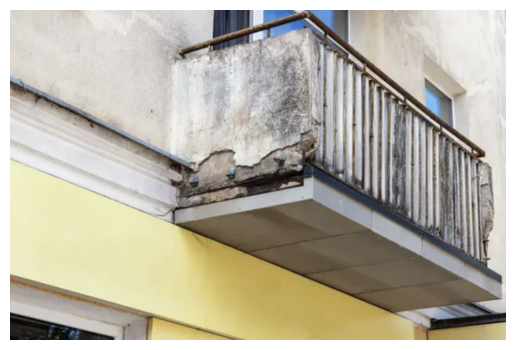

In [ ]:
blob = bucket.blob("photos/12556.png")

# Download into memory
img_bytes = blob.download_as_bytes()
img = Image.open(io.BytesIO(img_bytes))

plt.imshow(img)
plt.axis('off')
plt.show()

Let's now listen to the voice recording for sanity check of AI analysis.

In [ ]:
from IPython.display import Audio

Audio('audio_12556.mp3')

### Multimodal Query - Safety Inspection Example

We will run a slightly different query for the safety inspection project.

In [64]:
# Safety Inspection

q = """
SELECT
  project_id, project_type, city,
  inspector_name, inspection_date, inspection_address, observed_conditions, weather_conditions, risk_type, risk_obj, recommended_action, responsible_party, urgency_score

FROM AI.GENERATE_TABLE(
  MODEL `bq_hackathon_ds.gemini`,
  (
    SELECT
      (
    'Extract the full name of the person conducting the inspection, the date (MM-DD-YYYY), and the address. '
    'Provide a short summary of the observed safety conditions, based on both the photo and the voice recording. '
    'Rate the urgency of the project on a scale of 1-10, where 1 is low urgency and 10 is absolutely critical to safety. Do not inflate the score without a solid reason. '
    'Identify risk type, such as Fall Hazard, Electrical Shock, Fire Risk, Trip Hazard, Structural Collapse, Environmental. '
    'Identify object(s) that is a safety concern, e.g. ladders, platforms, lifts, forklifts, etc. '
    'Identify responsible party for fixing the safety issue if it exists. '
    'Write a single-sentence recommendation for the next action based on the voice recording. '
    'What are the weather conditions at the time of inspection? (rain, fog, sunny, clear, cloudy, etc.)'

      ,  project_type, img_ref, audio_ref
    ) AS prompt,
    project_id, project_type, city
    FROM `bq_hackathon_ds.projects_multimodal`
    WHERE project_type = 'safety inspection'
    AND project_id = 12559
  ),
  STRUCT(
     "inspector_name STRING, inspection_date STRING, inspection_address STRING, observed_conditions STRING, urgency_score INT64, risk_type ARRAY<STRING>, risk_obj ARRAY<STRING>, responsible_party ARRAY<STRING>, recommended_action STRING, weather_conditions STRING" AS output_schema
  )
)
"""

df = client.query(q).to_dataframe()
df

,project_id,project_type,city,inspector_name,inspection_date,inspection_address,observed_conditions,weather_conditions,risk_type,risk_obj,recommended_action,responsible_party,urgency_score
0,12559,safety inspection,Denver,Arnold Miller,08-28-2025,Unit 404 at Harvard Avenue,"The building is surrounded by scaffolding, but some working platforms are not fully boarded, and guard rails/toe boards are incomplete in areas. Materials, buckets, and bags are scattered at ground level. There is no visible debris netting, and it's unclear if the scaffolding is properly tied or supported. Workers are mixing materials and handling heavy items.",overcast,"[Fall Hazard, Trip Hazard, Structural Collapse]","[scaffolding, working platforms, guard rails, toe boards, materials, buckets, bags]",An urgent safety audit is recommended before continuing work.,"[Contractor, Site Management]",8


Let's now have a look at the photo for sanity check of AI analysis. Notice how AI was able to extract the RS Coloured Renders as an responsible party from a banner on the scaffolding structure.

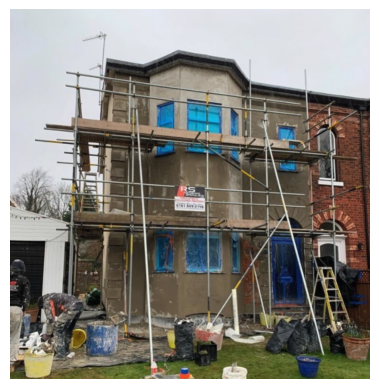

In [ ]:
blob = bucket.blob("photos/12559.png")

# Download into memory
img_bytes = blob.download_as_bytes()
img = Image.open(io.BytesIO(img_bytes))

plt.imshow(img)
plt.axis('off')
plt.show()

Let's now listen to the voice recording for sanity check of AI analysis.



In [ ]:
from IPython.display import Audio

Audio('audio_12559.mp3')

### Multimodal Query - Construction Example

We will run a slightly different query for a construction project.

In [66]:
# Construction Progress

q = """
SELECT
  project_id, project_type, city,
  inspector_name, inspection_date, inspection_address, observed_conditions, construction_obj, weather_conditions, progress_score, risks, recommended_action

FROM AI.GENERATE_TABLE(
  MODEL `bq_hackathon_ds.gemini`,
  (
    SELECT
      (
    'Extract the full name of the person conducting the inspection, the date (MM-DD-YYYY), and the address. '
    'Provide a short summary of the observed constuction site, based on both the photo and the voice recording. '
    'Categorize the object of construction e.g. staircase, garage, roof, etc. '
    'Score the progress of construction towards completion, from 1 to 10. '
    'Write a brief summary of the risks if they are mentioned. '
    'Write a single-sentence recommendation for the next action based on the voice recording. '
    'What are the weather conditions at the time of inspection? (rain, fog, sunny, clear, cloudy, etc.)'

      ,  project_type, img_ref, audio_ref
    ) AS prompt,
    project_id, project_type, city
    FROM `bq_hackathon_ds.projects_multimodal`
    WHERE project_type = 'construction'
    AND project_id = 12562
  ),
  STRUCT(
     "inspector_name STRING, inspection_date STRING, inspection_address STRING, observed_conditions STRING, construction_obj ARRAY<STRING>, progress_score INT64, risks STRING, recommended_action STRING, weather_conditions STRING" AS output_schema
  )
)
"""

df = client.query(q).to_dataframe()
df

,project_id,project_type,city,inspector_name,inspection_date,inspection_address,observed_conditions,construction_obj,weather_conditions,progress_score,risks,recommended_action
0,12562,construction,Houston,Ben Wilson,09-12-2025,Unit 132 at Riverside Street,"The construction site involves a roof installation with a steep pitch. Approximately half of the roof is covered with dark grey tiles, while the other half remains uncovered, displaying wooden battens over a dark underlayment. A chimney with a white cap is visible near the ridge on the completed section. In the foreground, a pallet holds stacks of roof tiles and other materials, appearing organized and ready for continued work. The site is active with materials on hand.",[roof],sunny,7,"Risks include falls due to the steep roof pitch, requiring harnesses and proper scaffolding. Injuries from lifting and handling heavy tiles are possible, necessitating careful practices. The uncovered roof section is vulnerable to water exposure if it rains before completion. Materials on the pallet should be secured to prevent tripping or falling hazards.",The next steps will be finishing the uncovered section and installing flashing around the chimney and ridge caps.


Let's now have a look at the photo for sanity check of AI analysis.

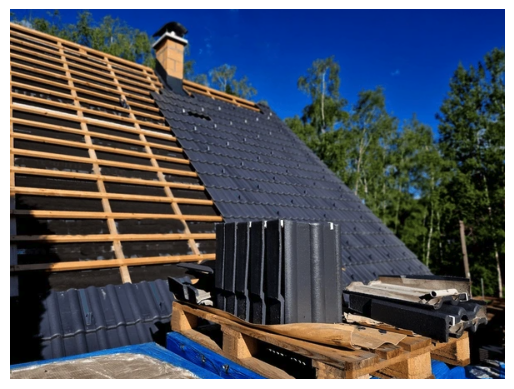

In [ ]:
blob = bucket.blob("photos/12562.png")

# Download into memory
img_bytes = blob.download_as_bytes()
img = Image.open(io.BytesIO(img_bytes))

plt.imshow(img)
plt.axis('off')
plt.show()

Let's now listen to the voice recording for sanity check of AI analysis.

In [ ]:
from IPython.display import Audio

Audio('audio_12562.mp3')

### Create Output Tables

Now once we had a look at the isolated examples and verified the model's output, we will run the multimodal queries on all of our data and create 3 new tables:
projects_renovation, projects_safety, projects_construction.
These tables will be used for more in-depth aggregate analysis of our inspection projects.


In [67]:
# Create renovation table
q_r = """
CREATE OR REPLACE TABLE `bq_hackathon_ds.projects_renovation` AS
SELECT
  project_id, project_type, city,
  inspector_name, inspection_date, inspection_address, renovation_obj, observed_conditions, risks, assigned_crew, recommended_action, urgency_score

FROM AI.GENERATE_TABLE(
  MODEL `bq_hackathon_ds.gemini`,
  (
    SELECT
      (
    'Extract the full name of the person conducting the inspection, the date (MM-DD-YYYY), and the address. '
    'Identify the object of renovation from the photo and voice recording. Return just the object name, up to 3 words. '
    'Provide a short summary of the observed conditions of the object, based on both the photo and the voice recording. '
    'Objectively rate the urgency of the project on a scale of 1-10, where 1 is low urgency and 10 is absolutely critical to safety. Do not inflate the urgency without a solid reason. '
    'Write a brief summary of the risks associated with this renovation project. '
    'Identify a crew or a specialist that will be working on this renovation project based on the voice recording. Keep it short. '
    'Write a single-sentence recommendation for the next action based on the voice recording.'
      ,  project_type, img_ref, audio_ref
    ) AS prompt,
    project_id, project_type, city
    FROM `bq_hackathon_ds.projects_multimodal`
    WHERE project_type = 'renovation'
  ),
  STRUCT(
     "inspector_name STRING, inspection_date STRING, inspection_address STRING, renovation_obj ARRAY<STRING>, observed_conditions STRING, urgency_score INT64, risks STRING, assigned_crew ARRAY<STRING>, recommended_action STRING" AS output_schema
  )
)
"""

# Create safety table
q_s = """
CREATE OR REPLACE TABLE `bq_hackathon_ds.projects_safety` AS
SELECT
  project_id, project_type, city,
  inspector_name, inspection_date, inspection_address, observed_conditions, weather_conditions, risk_type, risk_obj, recommended_action, responsible_party, urgency_score

FROM AI.GENERATE_TABLE(
  MODEL `bq_hackathon_ds.gemini`,
  (
    SELECT
      (
    'Extract the full name of the person conducting the inspection, the date (MM-DD-YYYY), and the address. '
    'Provide a short summary of the observed safety conditions, based on both the photo and the voice recording. '
    'Objectively rate the urgency of the project on a scale of 1-10, where 1 is low urgency and 10 is absolutely critical to safety. Do not inflate the urgency without a solid reason. '
    'Identify risk type, such as Fall Hazard, Electrical Shock, Fire Risk, Trip Hazard, Structural Collapse, Environmental. '
    'Identify object(s) that is a safety concern, e.g. ladders, platforms, lifts, forklifts, etc. '
    'Identify responsible party for fixing the safety issue if it exists. '
    'Write a single-sentence recommendation for the next action based on the voice recording. '
    'What are the weather conditions at the time of inspection? (rain, fog, sunny, clear, cloudy, etc.)'

      ,  project_type, img_ref, audio_ref
    ) AS prompt,
    project_id, project_type, city
    FROM `bq_hackathon_ds.projects_multimodal`
    WHERE project_type = 'safety inspection'
  ),
  STRUCT(
     "inspector_name STRING, inspection_date STRING, inspection_address STRING, observed_conditions STRING, urgency_score INT64, risk_type ARRAY<STRING>, risk_obj ARRAY<STRING>, responsible_party ARRAY<STRING>, recommended_action STRING, weather_conditions STRING" AS output_schema
  )
)
"""

# Create construction table
q_c = """
CREATE OR REPLACE TABLE `bq_hackathon_ds.projects_construction` AS
SELECT
  project_id, project_type, city,
  inspector_name, inspection_date, inspection_address, observed_conditions, construction_obj, weather_conditions, progress_score, risks, recommended_action

FROM AI.GENERATE_TABLE(
  MODEL `bq_hackathon_ds.gemini`,
  (
    SELECT
      (
    'Extract the full name of the person conducting the inspection, the date (MM-DD-YYYY), and the address. '
    'Provide a short summary of the observed constuction site, based on both the photo and the voice recording. '
    'Categorize the object of construction e.g. staircase, garage, roof, etc. '
    'Score the progress of construction towards completion, from 1 to 10. '
    'Write a brief summary of the risks if they are mentioned. '
    'Write a single-sentence recommendation for the next action based on the voice recording. '
    'What are the weather conditions at the time of inspection? (rain, fog, sunny, clear, cloudy, etc.)'

      ,  project_type, img_ref, audio_ref
    ) AS prompt,
    project_id, project_type, city
    FROM `bq_hackathon_ds.projects_multimodal`
    WHERE project_type = 'construction'
  ),
  STRUCT(
     "inspector_name STRING, inspection_date STRING, inspection_address STRING, observed_conditions STRING, construction_obj ARRAY<STRING>, progress_score INT64, risks STRING, recommended_action STRING, weather_conditions STRING" AS output_schema
  )
)
"""

# Run queries in BigQuery
client.query(q_r)
client.query(q_s)
client.query(q_c)

QueryJob<project=gen-lang-client-0812538624, location=US, id=f7b2c9e1-3b6f-42cb-90e0-d49ef7442cbc>

In [68]:
# View renovation table
q = """
SELECT *
FROM bq_hackathon_ds.projects_renovation
ORDER BY urgency_score DESC
LIMIT 5
"""

df = client.query(q).to_dataframe()
df

,project_id,project_type,city,inspector_name,inspection_date,inspection_address,renovation_obj,observed_conditions,risks,assigned_crew,recommended_action,urgency_score
0,12556,renovation,Dallas,John Smith,09-20-2025,"Unit 304, 29 Bank Street",[balcony],"The balcony is in poor condition with heavy spalling of the concrete slab, exposing rusted and corroded rebar. The metal railing is also deteriorated, rusted throughout, with worn paint and weakened anchoring points.","The structural integrity of the balcony is likely compromised due to extensive spalling and corrosion, posing significant safety hazards.",[structural engineer],A structural engineer's assessment is needed to determine if partial repair or full slab and railing replacement is required.,9
1,12557,renovation,Dallas,Arnold Miller,08-12-2025,Lincoln Boulevard 23,[Main wooden staircase],"The main wooden staircase and stairwell have peeling and chipping white paint, exposing bare wood on treads and risers. There is significant wear suggesting heavy use and possible moisture damage. The staircase appears narrow and old, with a basic, potentially loose handrail that may not meet current safety codes.","Risks include potential falls due to loose or worn treads and a non-code-compliant handrail, structural instability if underlying issues are not addressed, and exposure to lead paint given the age of the building.","[Lead Paint Specialist, Structural Engineer]","Prioritize safety and structural integrity checks, including testing for lead paint and assessing stability, before any cosmetic upgrades are made.",8
2,12561,renovation,Austin,Jake Keltner,09-06-2025,Second High Street Apartment 15,[Walls and ceiling],"Widespread mold growth with small black spots and larger fuzzy patches on the walls and extending onto the wooden soffit overhead. Hairline cracks are present on the walls, indicating a persistent moisture issue likely from poor ventilation or leaks, and a musty odor is expected.","Health risks associated with mold exposure, potential structural damage from persistent moisture, and recurrence of mold if the underlying moisture source is not identified and fixed.",[Professional remediation crew],Identify and fix the moisture source before initiating professional remediation to prevent mold recurrence.,8
3,12558,renovation,Austin,Jake Kellner,09-19-2025,22nd Main Street Unit 201,[Wall and ceiling],"A thin, clearly visible crack starts at the upper corner of the door frame and runs diagonally across the wall and into the ceiling.","Possible structural issues if the crack widens, or if underlying settlement or framing stress is severe.",[Structural engineer],Monitor the crack for widening and confirm the root cause before any repair work is done.,3


In [69]:
# View safety table
q = """
SELECT *
FROM bq_hackathon_ds.projects_safety
ORDER BY urgency_score DESC
LIMIT 5
"""

df = client.query(q).to_dataframe()
df

,project_id,project_type,city,inspector_name,inspection_date,inspection_address,observed_conditions,weather_conditions,risk_type,risk_obj,recommended_action,responsible_party,urgency_score
0,12560,safety inspection,Denver,Antonie Pence,08-15-2025,Kings Avenue 351,"The two-story tube and fitting type scaffolding lacks clear evidence of proper base plates or sole boards on uneven ground, has incomplete bracing, is not confirmed to be tied securely to the building, exhibits incomplete guard rails with missing mid-rails and toe boards on the top platform, features a ladder that may not be secured or extended high enough, and has no debris netting or overhead protection; furthermore, no inspection tag is visible.",Cloudy,"[Fall Hazard, Structural Collapse]","[Scaffolding, Ladder]",The scaffold needs to be checked and signed off by a competent inspector before anyone continues work.,"[Contractor, Scaffolding company]",9
1,12559,safety inspection,Denver,Arnold Miller,08-28-2025,Unit 404 at Harvard Avenue,"The building is surrounded by scaffolding, with some working platforms not fully boarded, guard rails and toe boards are incomplete in certain areas, and materials are scattered at ground level creating tripping hazards. There is no visible debris netting, and it is unclear if the scaffolding is fully tied to the building or properly supported at the base.",cloudy with light rain,"[Fall Hazard, Trip Hazard, Structural Collapse]","[scaffolding, working platforms, materials, buckets, bags]",An urgent safety audit is recommended before continuing work.,"[Scaffolding Company, General Contractor]",9


In [70]:
# View construction table
q = """
SELECT *
FROM bq_hackathon_ds.projects_construction
ORDER BY progress_score DESC
LIMIT 5
"""

df = client.query(q).to_dataframe()
df

,project_id,project_type,city,inspector_name,inspection_date,inspection_address,observed_conditions,construction_obj,weather_conditions,progress_score,risks,recommended_action
0,12563,construction,Houston,Mike Pete,09-15-2025,Bank Street 203,"The roof framing, including rafters, ridge boards, and hips, is fully installed with fresh, well-secured timber and proper connectors. The chimney area is carefully framed with saddles for water diversion, and the scaffolding is up around the perimeter. The building now has its full roof shape.",[roof],cloudy,8,No immediate risks identified.,The team should now move on to sheathing and underlayment to prepare the roof for weather-tightness.
1,12562,construction,Houston,Ben Wilson,09-12-2025,Unit 132 at Riverside Street,"Roughly half of the steep-pitched roof is covered with dark gray tiles, while the other half shows wooden battens over a dark underlayment. A chimney with a white cap is visible near the ridge on the completed section. A pallet with stacks of roof tiles and other materials is in the foreground, indicating readiness for ongoing work.",[roof],sunny,6,Steep roof presents fall hazards requiring harnesses and scaffolding. Heavy tiles require careful lifting to prevent injuries. Uncovered sections are vulnerable to water exposure in case of rain. Materials on pallets should be secured to avoid tripping or falling hazards.,Next steps will be finishing the uncovered section and installing flashing around the chimney and ridge caps.


## Aggregate Analytics

We can also extract and analyse common themes from multiple inspections. For example, let's analyse primary safety issues by city.

In [36]:
q = """
SELECT
  city,
  issues
FROM AI.GENERATE_TABLE(
  MODEL `bq_hackathon_ds.gemini`,
  (
    SELECT (
      'Identify primary safety issues in each city based on images and voice recordings of construction inspections. Return short high-level tags. Do not repeat similar tags, try to group similar issues into one tag where possible. '
      , ARRAY_AGG(img_ref), ARRAY_AGG(audio_ref)
    ) AS prompt,
    city
    FROM `bq_hackathon_ds.projects_multimodal`
    GROUP BY city
  ),
  STRUCT(
     "issues ARRAY<STRING>" AS output_schema
  )
);
"""

df = client.query(q).to_dataframe()
df

,city,issues
0,Dallas,"[Balcony structural failure risk, Exposed and corroded rebar, Deteriorated railing, Staircase structural instability, Deteriorated treads, Non-compliant handrail]"
1,Austin,"[Mold Growth, Moisture Intrusion, Structural Cracks]"
2,Houston,"[Fall Protection, Manual Handling, Material Storage]"
3,Denver,"[Scaffold base stability, Incomplete bracing, Lack of scaffold ties, Inadequate fall protection, Unsecured ladder, No overhead protection, Missing inspection tag, Incomplete platforms, Poor housekeeping, Scaffold structural integrity, Manual handling concerns]"


Similarly, we can analyse common risks assosiated with renovation projects.

In [38]:
q = """
SELECT
  project_type,
  risks
FROM AI.GENERATE_TABLE(
  MODEL `bq_hackathon_ds.gemini`,
  (
    SELECT (
      'Identify primary risks assosiated with renovation projects, based on images and voice recordings of inspections. Return short high-level tags. Do not repeat similar tags, try to group similar risks into one tag where possible. '
      , ARRAY_AGG(img_ref), ARRAY_AGG(audio_ref)
    ) AS prompt,
    project_type
    FROM `bq_hackathon_ds.projects_multimodal`
    WHERE project_type = 'renovation'
    GROUP BY project_type
  ),
  STRUCT(
     "risks ARRAY<STRING>" AS output_schema
  )
);
"""

df = client.query(q).to_dataframe()
df

,project_type,risks
0,renovation,"[Mold and Moisture Damage, Structural Integrity Issues, Material Deterioration, Safety Hazards, Lead Paint Presence, Code Compliance Failure]"


## Report Automation - Safety Inspection Example

Lastly, we can use the extracted information to easily draft a field inspection report.

In [72]:
import pandas as pd
from IPython.display import Markdown, display

# View safety table
q = """
SELECT *
FROM bq_hackathon_ds.projects_safety
WHERE project_id = 12560
"""

df = client.query(q).to_dataframe()

# Extract the single row of data
row = df.iloc[0]

# Format the array data into readable strings for the report
risk_types = ", ".join(row['risk_type'])
risk_objects = ", ".join(row['risk_obj'])
responsible_parties = ", ".join(row['responsible_party'])

# Define the Markdown template and insert the data
markdown_template = f"""
# Safety Inspection Report

## Project Details
* **Project ID:** {row['project_id']}
* **Project Type:** {row['project_type']}
* **City:** {row['city']}

## Inspection Details
* **Inspector:** {row['inspector_name']}
* **Date:** {row['inspection_date']}
* **Address:** {row['inspection_address']}
* **Weather:** {row['weather_conditions']}

## Findings
* **Observed Conditions:** {row['observed_conditions']}
* **Risk Type(s):** {risk_types}
* **Associated Object(s):** {risk_objects}
* **Urgency Score (1-10):** {row['urgency_score']} ⚠️

## Recommended Actions
* **Action(s):** {row['recommended_action']}
* **Responsible Party/Parties:** {responsible_parties}

"""

# Display the report in the notebook
display(Markdown(markdown_template))


# Safety Inspection Report

## Project Details
* **Project ID:** 12560
* **Project Type:** safety inspection
* **City:** Denver

## Inspection Details
* **Inspector:** Antonie Pence
* **Date:** 08-15-2025
* **Address:** Kings Avenue 351
* **Weather:** Cloudy

## Findings
* **Observed Conditions:** The two-story tube and fitting type scaffolding lacks clear evidence of proper base plates or sole boards on uneven ground, has incomplete bracing, is not confirmed to be tied securely to the building, exhibits incomplete guard rails with missing mid-rails and toe boards on the top platform, features a ladder that may not be secured or extended high enough, and has no debris netting or overhead protection; furthermore, no inspection tag is visible.
* **Risk Type(s):** Fall Hazard, Structural Collapse
* **Associated Object(s):** Scaffolding, Ladder
* **Urgency Score (1-10):** 9 ⚠️

## Recommended Actions
* **Action(s):** The scaffold needs to be checked and signed off by a competent inspector before anyone continues work.
* **Responsible Party/Parties:** Contractor, Scaffolding company



In [ ]:
# Cleaning up

# Delete the BigQuery tables
# ! bq rm --table -f bq_hackathon_ds.projects
# ! bq rm --table -f bq_hackathon_ds.audio_obj_table
# ! bq rm --table -f bq_hackathon_ds.img_obj_table
# ! bq rm --table -f bq_hackathon_ds.projects_safety
# ! bq rm --table -f bq_hackathon_ds.projects_renovation
# ! bq rm --table -f bq_hackathon_ds.projects_construction

# # Delete the remote model
# ! bq rm --model -f bq_hackathon_ds.gemini

# # Delete the remote connection
# ! bq rm --connection --project_id=$PROJECT_ID --location=us bq-kaggle-conn

# # Delete the BigQuery dataset
# ! bq rm -r -f $PROJECT_ID:bq_hackathon_ds

## Conclusion

In this notebook, we demonstrated how **BigQuery’s native AI capabilities** can automate the traditionally manual and costly process of preparing field inspection reports.  
By leveraging `AI.GENERATE_TABLE` and `OBJECT_TABLES`, we extracted structured insights from unstructured data sources such as site photos and voice recordings.

Our experiments showed that the model can capture key information from unstructured inputs with strong accuracy. While this represents an early-stage implementation, it highlights a clear path for integrating AI into the construction industry, where the demand for **safety assessments, progress tracking, and regulatory compliance** continues to grow.

This approach not only reduces the administrative burden on inspectors but also accelerates reporting workflows, enabling stakeholders to make faster, data-driven decisions. Ultimately, AI-driven field reporting can improve efficiency, lower costs, and enhance safety outcomes across construction projects.
